In [35]:
#library imports
import os
import random
import math
from datetime import datetime
from collections import Counter
import pandas as pd
import numpy as np

import cv2
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from sklearn.model_selection import train_test_split
import xml.etree.ElementTree as ET

import torch
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

In [36]:
import torch

In [7]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

In [4]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 24

In [5]:
class_names = ['crop','weed']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [6]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [7]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin

        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        )

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name,
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image,
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image,
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [18]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

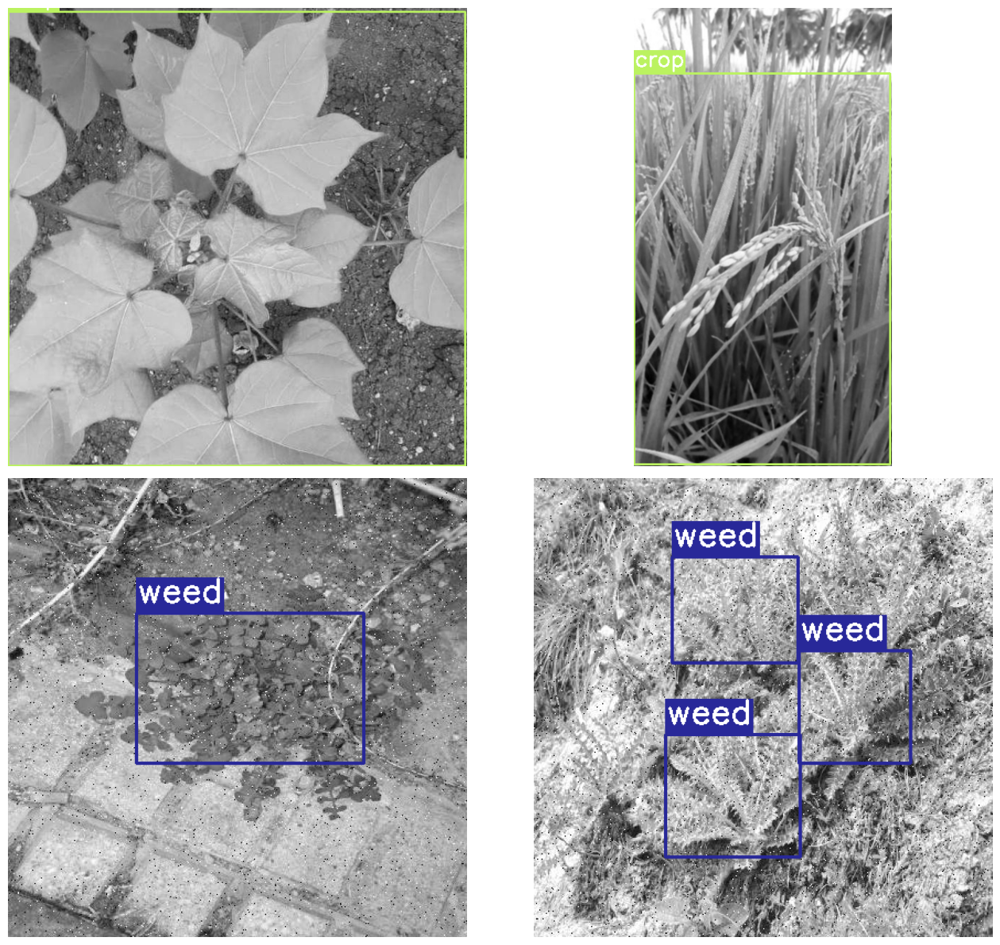

In [19]:
# Visualize a few training images.
plot(
    image_paths='/home/eilaka/Documents/ztm-pytorch-course/final/green_trained/images/*',
    label_paths='/home/eilaka/Documents/ztm-pytorch-course/final/green_trained/labels/*',
    num_samples=4
)

In [20]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [21]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

In [12]:
%cd yolov5/
!pwd

/home/eilaka/Documents/ztm-pytorch-course/final/yolov5
/usr/bin/zsh: /home/eilaka/miniconda3/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
/home/eilaka/Documents/ztm-pytorch-course/final/yolov5


In [23]:
monitor_tensorboard()

In [24]:
# !python train.py --epochs 100 --workers 4 --device 0 --batch-size 32 \
# --data data/pothole.yaml --img 640 640 --cfg cfg/training/yolov7_pothole-tiny.yaml \
# --weights 'yolov7-tiny.pt' --name yolov7_tiny_pothole_fixed_res --hyp data/hyp.scratch.tiny.yaml


In [25]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../green.yaml --weights yolov5s.pt \
    --img 640 --cfg ../yolov5/models/yolov5s-Copy1.yaml --epochs {EPOCHS} --batch-size 10 --name {RES_DIR}

Current number of result directories: 18
results_19
/usr/bin/zsh: /home/eilaka/miniconda3/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

2023-09-04 15:34:34.197603: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=../yolov5/models/yolov5s-Copy1.yaml, data=../green.yaml, hyp=data/hyp

In [30]:
# Function to show validation predictions saved during training.
RES_DIR = 'results_19'
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [31]:
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [32]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

/usr/bin/zsh: /home/eilaka/miniconda3/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
confusion_matrix.png			       results.png
events.out.tfevents.1693558515.eilaka.16311.0  train_batch0.jpg
F1_curve.png				       train_batch1.jpg
hyp.yaml				       train_batch2.jpg
labels_correlogram.jpg			       val_batch0_labels.jpg
labels.jpg				       val_batch0_pred.jpg
opt.yaml				       val_batch1_labels.jpg
P_curve.png				       val_batch1_pred.jpg
PR_curve.png				       val_batch2_labels.jpg
R_curve.png				       val_batch2_pred.jpg
results.csv				       weights
['runs/train/results_14/val_batch2_pred.jpg', 'runs/train/results_14/val_batch0_pred.jpg', 'runs/train/results_14/val_batch1_pred.jpg']


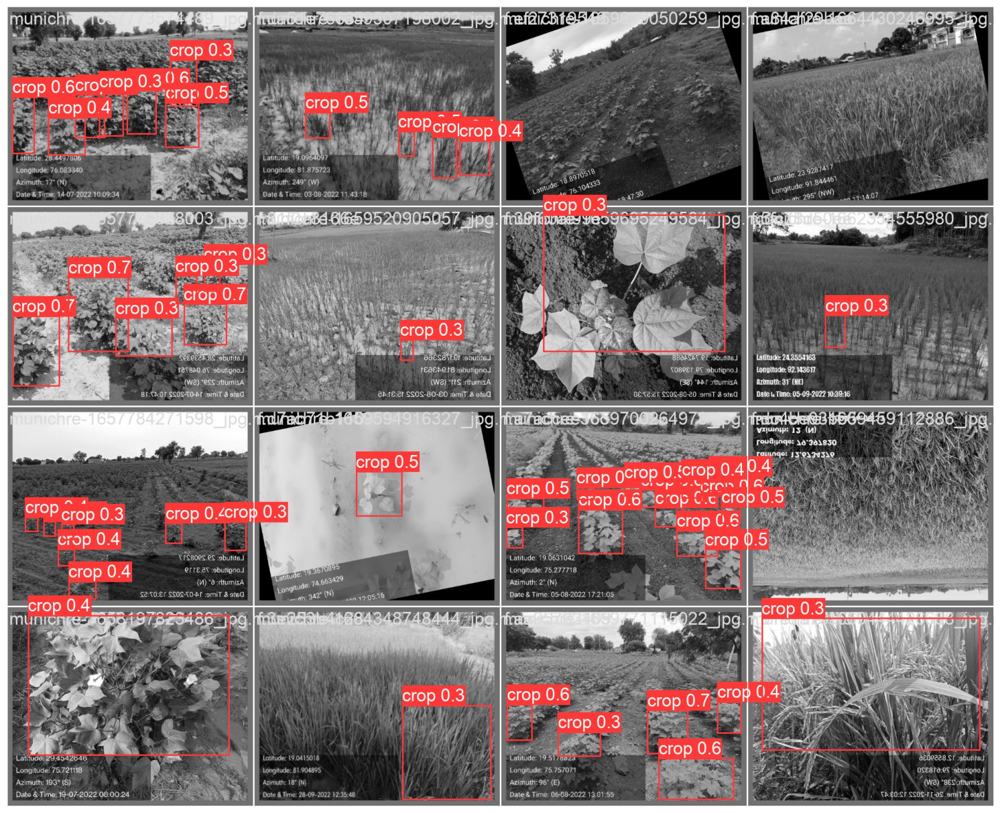

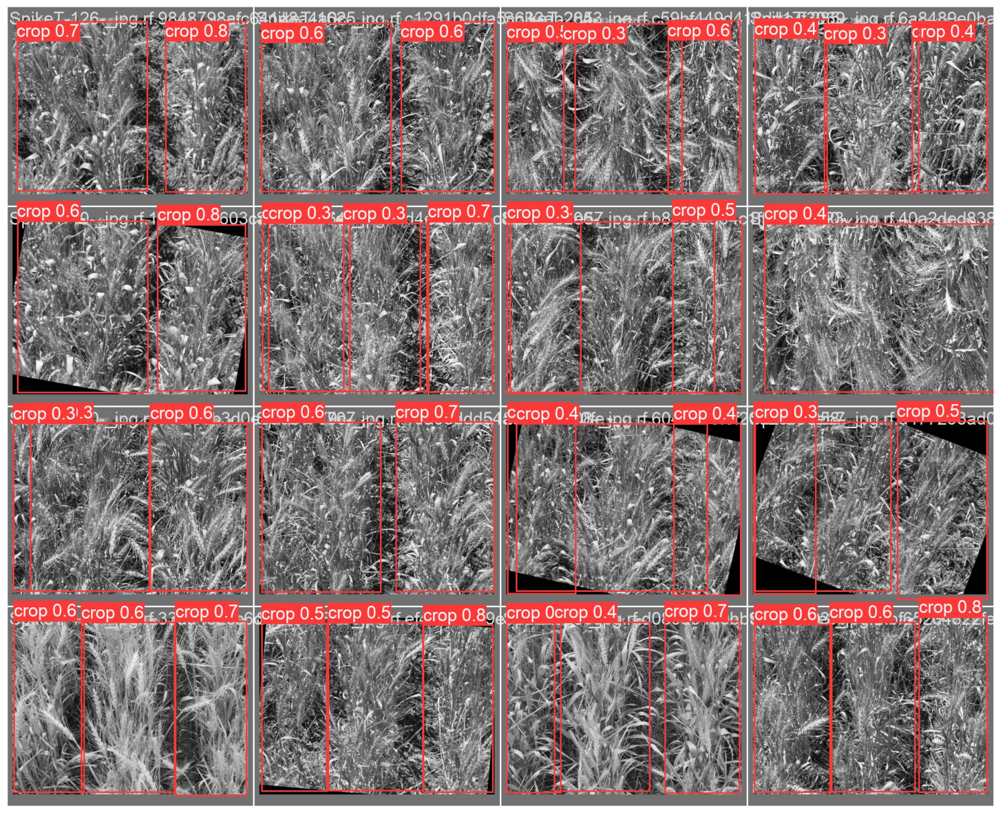

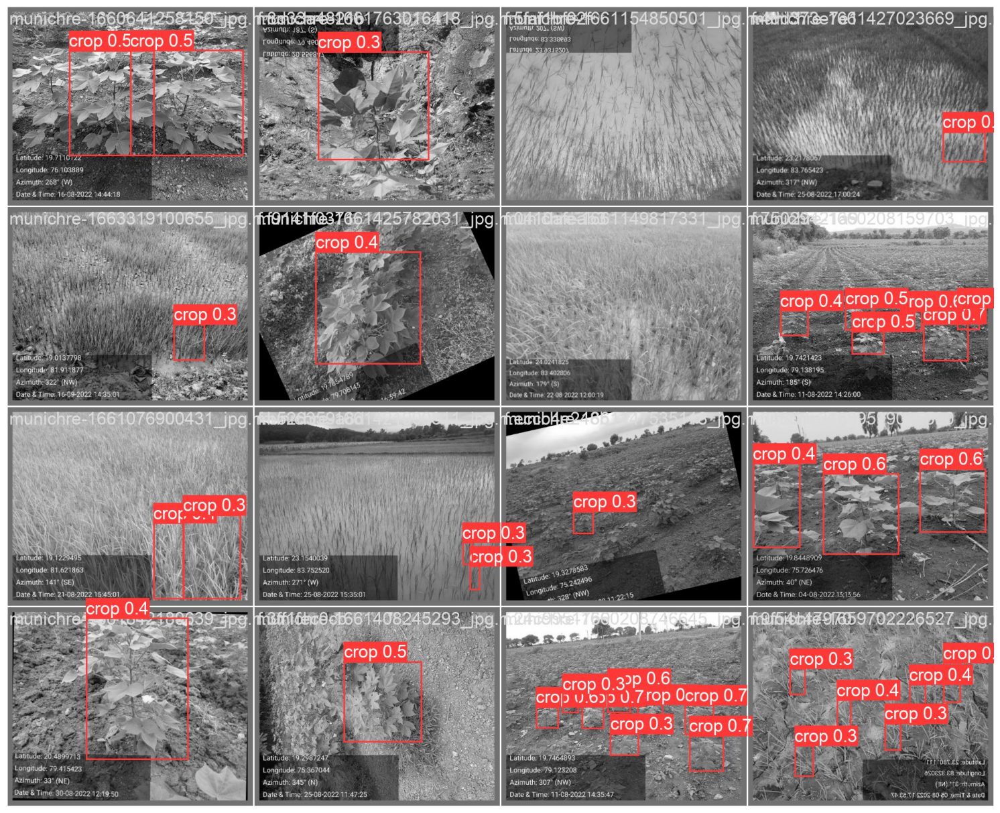

In [33]:
show_valid_results(RES_DIR)

In [34]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, '/home/eilaka/Documents/ztm-pytorch-course/final/weed/')

Current number of inference detection directories: 23
inference_24
/usr/bin/zsh: /home/eilaka/miniconda3/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

detect: weights=['runs/train/results_14/weights/best.pt'], source=/home/eilaka/Documents/ztm-pytorch-course/final/weed/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, no

In [16]:
!nvidia-smi

/usr/bin/zsh: /home/eilaka/miniconda3/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
Thu Sep  7 16:11:05 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.125.06   Driver Version: 525.125.06   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:01:00.0 Off |                  N/A |
| N/A   52C    P3    N/A /  30W |      6MiB /  4096MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+------------------